# <a id="1"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">1. Setup</div>

<a id="1.1"></a>
# <b><span style='color:#8D6D9B'>1.1. Package and Library</span></b>

In [1]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
import shutil             # to copy images to another directory 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input , Rescaling , Resizing
from keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.applications import MobileNetV2

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

<a id="1.2"></a>
# <b><span style='color:#8D6D9B'>1.2. Load The Data</span></b>

In [2]:
dataDirList = ['/kaggle/input/garbage-classification/Garbage classification/Garbage classification/']

selectedClasses = ['metal', 'glass', 'paper', 'trash', 'cardboard', 'plastic']

In [3]:
imgPaths = []
labels = []
for dataDir in dataDirList:
    for className in os.listdir(dataDir):
        if className in selectedClasses :
            classPath = os.path.join(dataDir,className)
            for img in os.listdir(classPath):
                imgPath = os.path.join(classPath,img)
                imgPaths.append(imgPath)
                if className == 'white-glass':
                    className = 'glass'
                labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            # Shuffle

df

,imgPath,label
0,/kaggle/input/garbage-classification/Garbage c...,cardboard
1,/kaggle/input/garbage-classification/Garbage c...,plastic
2,/kaggle/input/garbage-classification/Garbage c...,cardboard
3,/kaggle/input/garbage-classification/Garbage c...,plastic
4,/kaggle/input/garbage-classification/Garbage c...,glass
...,...,...
2522,/kaggle/input/garbage-classification/Garbage c...,metal
2523,/kaggle/input/garbage-classification/Garbage c...,paper
2524,/kaggle/input/garbage-classification/Garbage c...,paper
2525,/kaggle/input/garbage-classification/Garbage c...,metal


# <a id="2"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">2. Spliting</div>

In [4]:
# get the ratio such as 15% of each class for testing 
def DataFrameSpliting(df , ratio , classesList):
    
    trainDf = pd.DataFrame(columns = ['imgPath','label'])
    testDf = pd.DataFrame(columns = ['imgPath','label'])
    for clas in classesList :
        tempDf = df[df['label'] == clas]
        lastIndex = int(len(tempDf) * ratio)
        trainClassDf = tempDf[:lastIndex]
        testClassDf = tempDf[lastIndex:]
        trainDf = pd.concat([trainDf , trainClassDf] , axis=0)
        testDf = pd.concat([testDf , testClassDf] , axis=0)
        
    return trainDf.sample(frac=1).reset_index(drop=True) , testDf.sample(frac=1).reset_index(drop=True)  # shuffling , reset index

In [5]:
classList = list(df['label'].unique())
trainDf , testDf = DataFrameSpliting(df , 0.85 , classList)

In [7]:
trainDf

,imgPath,label
0,/kaggle/input/garbage-classification/Garbage c...,plastic
1,/kaggle/input/garbage-classification/Garbage c...,paper
2,/kaggle/input/garbage-classification/Garbage c...,plastic
3,/kaggle/input/garbage-classification/Garbage c...,metal
4,/kaggle/input/garbage-classification/Garbage c...,plastic
...,...,...
2139,/kaggle/input/garbage-classification/Garbage c...,paper
2140,/kaggle/input/garbage-classification/Garbage c...,paper
2141,/kaggle/input/garbage-classification/Garbage c...,paper
2142,/kaggle/input/garbage-classification/Garbage c...,plastic


In [8]:
trainDf['label'].value_counts()

label
paper        504
glass        425
plastic      409
metal        348
cardboard    342
trash        116
Name: count, dtype: int64

In [9]:
testDf

,imgPath,label
0,/kaggle/input/garbage-classification/Garbage c...,plastic
1,/kaggle/input/garbage-classification/Garbage c...,cardboard
2,/kaggle/input/garbage-classification/Garbage c...,metal
3,/kaggle/input/garbage-classification/Garbage c...,metal
4,/kaggle/input/garbage-classification/Garbage c...,paper
...,...,...
378,/kaggle/input/garbage-classification/Garbage c...,plastic
379,/kaggle/input/garbage-classification/Garbage c...,trash
380,/kaggle/input/garbage-classification/Garbage c...,metal
381,/kaggle/input/garbage-classification/Garbage c...,metal


In [10]:
testDf['label'].value_counts()

label
paper        90
glass        76
plastic      73
metal        62
cardboard    61
trash        21
Name: count, dtype: int64

# <a id="3"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">3. Data Explorations</div>

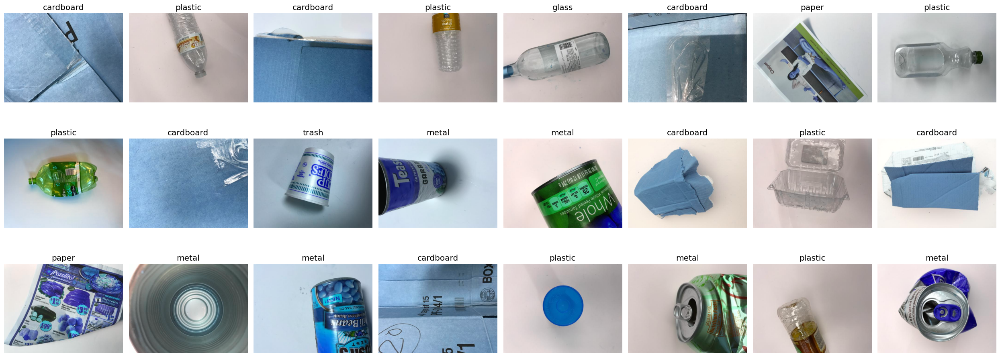

In [11]:
imgPaths = df['imgPath']
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for ax,imgPath in zip(axs , imgPaths):
    label = str(imgPath).split('/')[-2]    # extract label of an imgae from a path 
    img = cv2.imread(imgPath)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')
    
plt.tight_layout()
plt.show()

# <a id="4"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">4. Data Augmentation</div>

In [12]:
datagenTrain = ImageDataGenerator(
            rescale=1./255,
            zoom_range=(1.0, 1.2),   # zoom in 
            horizontal_flip=True,
            vertical_flip=True,
            rotation_range=45,
)

In [13]:
IMG_SIZE = (224,224)

trainGenerator = datagenTrain.flow_from_dataframe(
    trainDf ,
    x_col='imgPath',
    y_col='label',
    target_size=IMG_SIZE,
    batch_size=64 ,                    # Generate 64 image from the datagenTrain (flipped , rotated , zoomed , ....)  at once 
    class_mode='categorical'
)

Found 2144 validated image filenames belonging to 6 classes.


In [14]:
datagenTest = ImageDataGenerator( rescale=1./255 )

testGenerator = datagenTest.flow_from_dataframe(
    testDf ,
    x_col='imgPath',
    y_col='label',
    target_size=IMG_SIZE,
    batch_size=8 ,
    class_mode='categorical',
    shuffle=False
)


Found 383 validated image filenames belonging to 6 classes.


In [15]:
print(f"Training set size: {trainGenerator.samples}")
print(f"Testing set size: {testGenerator.samples}")

Training set size: 2144
Testing set size: 383


In [16]:
import math

steps_per_epoch = trainGenerator.samples // trainGenerator.batch_size
validation_steps = math.ceil(testGenerator.samples / testGenerator.batch_size)

print("steps_per_epoch:", steps_per_epoch)
print("validation_steps:", validation_steps)


steps_per_epoch: 33
validation_steps: 48


In [17]:
from collections import Counter
counter = Counter(trainGenerator.classes)
total = float(sum(counter.values()))
class_weight = {cls: total/(len(counter)*count) for cls, count in counter.items()}

print("class counts:", counter)
print("class_weight:", class_weight)

class counts: Counter({3: 504, 1: 425, 4: 409, 2: 348, 0: 342, 5: 116})
class_weight: {4: 0.8736756316218419, 3: 0.708994708994709, 2: 1.0268199233716475, 1: 0.8407843137254902, 0: 1.0448343079922027, 5: 3.0804597701149423}


In [18]:
# inspect a single batch from trainGenerator
x_batch, y_batch = next(trainGenerator)
print("x_batch shape:", x_batch.shape)
print("y_batch shape:", y_batch.shape)
print("first 5 labels (one-hot):", y_batch[:5])

x_batch shape: (64, 224, 224, 3)
y_batch shape: (64, 6)
first 5 labels (one-hot): [[0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0.]]


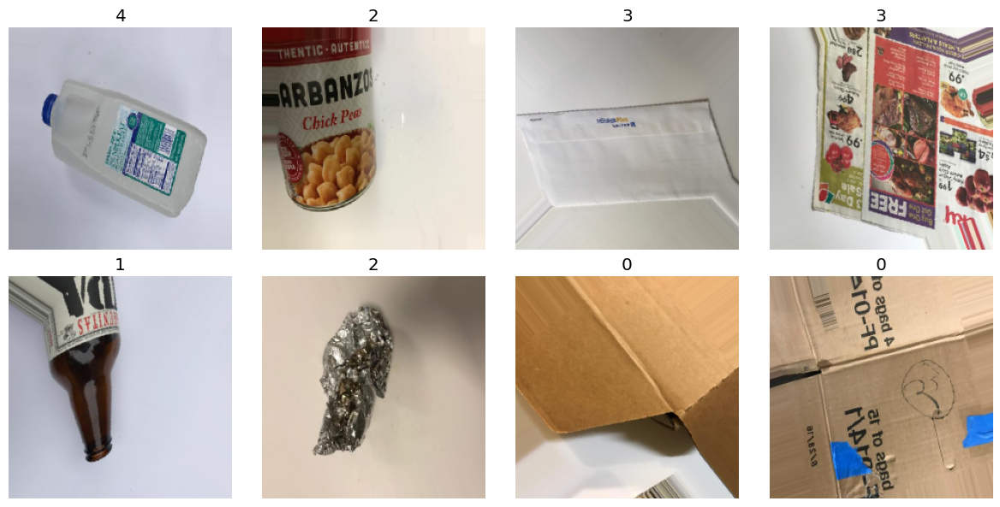

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# get an augmented batch and visualize first 8 images
x_batch, y_batch = next(trainGenerator)
fig, axes = plt.subplots(2,4, figsize=(12,6))
for i, ax in enumerate(axes.ravel()):
    ax.imshow(x_batch[i])
    ax.set_title(np.argmax(y_batch[i]))
    ax.axis('off')
plt.tight_layout()
plt.show()

# <a id="5"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">5. Modeling </div>

In [20]:
with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([
        
#         Resizing(IMG_SIZE),
        
#         Rescaling(1./255),     These two steps ,we did perform them above with test and image generator 
    
        MobileNetV2(weights='imagenet', include_top=False, input_shape=(224,224,3)),
        
        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(64,activation='relu'),
        
        BatchNormalization(),
        
        Dropout(0.08),

        Dense(6 ,activation='softmax')
    ])

In [21]:
preTrainedModel = Model.layers[0]
for layer in preTrainedModel.layers[:-4]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

In [22]:
Model.compile(optimizer='adam',loss='categorical_crossentropy' ,metrics=['accuracy'])

In [23]:
history = Model.fit(trainGenerator,
                    validation_data = testGenerator, 
                    epochs=50,
                    verbose=1,
                    callbacks=[tf.keras.callbacks.EarlyStopping(
                                       patience=4,
                                       monitor='val_accuracy',
                                       restore_best_weights=True)])

Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1756484171.170237    2161 service.cc:145] XLA service 0x7819140037f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1756484171.170321    2161 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1756484171.170326    2161 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


 2/34 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - accuracy: 0.2422 - loss: 2.0868  

I0000 00:00:1756484181.478145    2161 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


34/34 ━━━━━━━━━━━━━━━━━━━━ 53s 956ms/step - accuracy: 0.6059 - loss: 1.1853 - val_accuracy: 0.6789 - val_loss: 1.2575
Epoch 2/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 26s 616ms/step - accuracy: 0.8192 - loss: 0.5047 - val_accuracy: 0.8120 - val_loss: 0.5715
Epoch 3/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 27s 633ms/step - accuracy: 0.8643 - loss: 0.3584 - val_accuracy: 0.7728 - val_loss: 0.6989
Epoch 4/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 27s 621ms/step - accuracy: 0.9069 - loss: 0.2820 - val_accuracy: 0.7493 - val_loss: 0.8028
Epoch 5/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 27s 622ms/step - accuracy: 0.9188 - loss: 0.2363 - val_accuracy: 0.8042 - val_loss: 0.6461
Epoch 6/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 26s 618ms/step - accuracy: 0.9325 - loss: 0.1921 - val_accuracy: 0.8172 - val_loss: 0.6359
Epoch 7/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 26s 609ms/step - accuracy: 0.9418 - loss: 0.1640 - val_accuracy: 0.8198 - val_loss: 0.6203
Epoch 8/50
34/34 ━━━━━━━━━━━━━━━━━━━━ 26s 614ms/step - accuracy: 0.9492 - loss: 0.1410 - val_accuracy: 0.822

In [24]:
Model.summary()
Model.save("MobileNetV2.h5")

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 62720)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     4,014,144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,127,700 (57.71 MB)

 Trainable params: 4,427,462 (16.89 MB)

 Non-trainable params: 1,845,312 (7.04 MB)

 Optimizer params: 8,854,926 (33.78 MB)

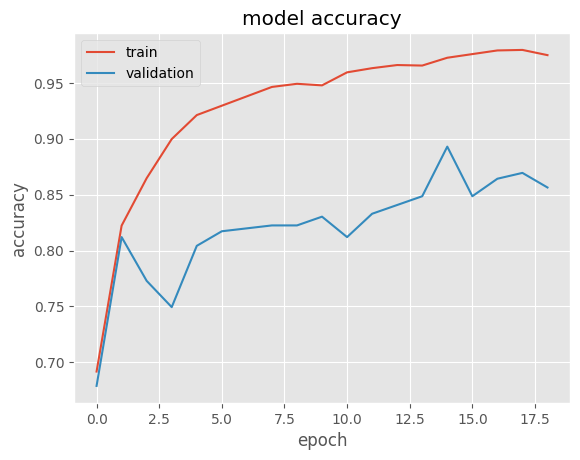

In [25]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

# <a id="6"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">6. Evaluation</div>

In [26]:
predictions = Model.predict(testGenerator)

48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step


In [27]:
trainGenerator.class_indices

{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}

In [28]:
trueClasses = testGenerator.classes
trueClasses[:10]

[4, 0, 2, 2, 3, 1, 0, 3, 0, 4]

In [29]:
predictedClasses = predictions.argmax(axis=-1)
predictedClasses[:10]

array([4, 0, 2, 2, 3, 1, 0, 3, 0, 4])

In [30]:
test_loss, test_accuracy = Model.evaluate(testGenerator)
test_accuracy

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.9078 - loss: 0.3630


0.8929504156112671

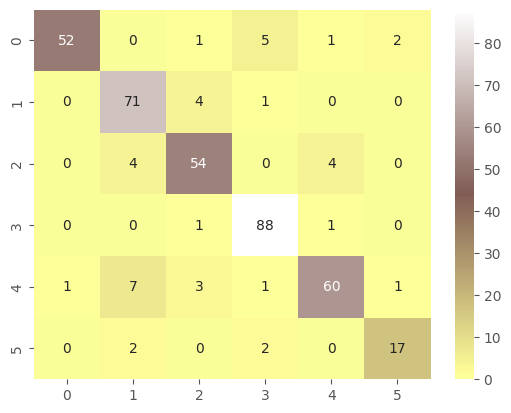

In [31]:
CM = confusion_matrix(trueClasses, predictedClasses)
sns.heatmap(CM, center = True,cmap='terrain',annot=True ,fmt='.5g')
plt.show()

In [32]:
ClassificationReport = classification_report(trueClasses, predictedClasses)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.98      0.85      0.91        61
           1       0.85      0.93      0.89        76
           2       0.86      0.87      0.86        62
           3       0.91      0.98      0.94        90
           4       0.91      0.82      0.86        73
           5       0.85      0.81      0.83        21

    accuracy                           0.89       383
   macro avg       0.89      0.88      0.88       383
weighted avg       0.90      0.89      0.89       383



# <a id="7"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">7. Predected Images</div>

In [33]:

images = []
predictedClasses = []
trueClasses = []


class_labels = list(testGenerator.class_indices.keys())

for i in range(len(testGenerator)):
    img_batch, true_labels_batch = next(testGenerator)  # Get next batch
    true_class_idx = np.argmax(true_labels_batch[0])  # Get the true class index
    
    # Predict the class for the image
    prediction = Model.predict(img_batch)
    predicted_class_idx = np.argmax(prediction[0])  # Get the predicted class index
    
    # Convert the class indices to class labels
    predicted_class = class_labels[predicted_class_idx]
    true_class = class_labels[true_class_idx]
    
    images.append(np.squeeze(img_batch[0]))
    predictedClasses.append(predicted_class)
    trueClasses.append(true_class)
    
    if i >= 24:  # For example, only plot 24 images
        break

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


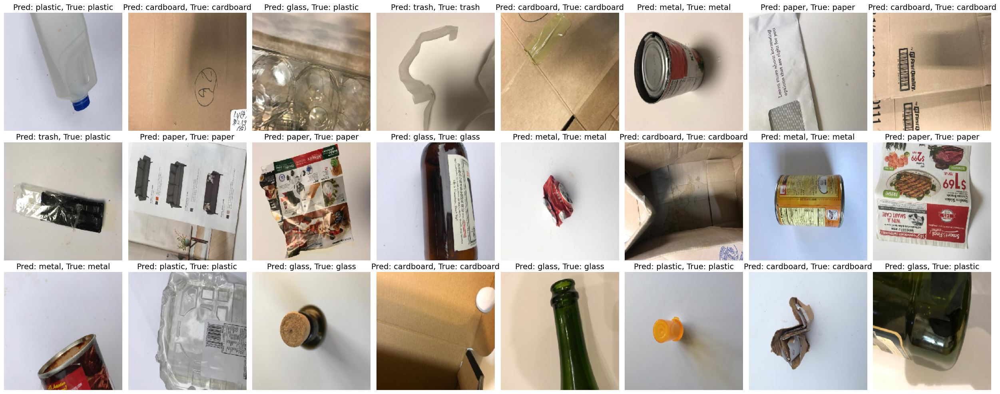

In [34]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))


axs = axs.flatten()

for ax,img , pred , true in zip(axs , images , predictedClasses , trueClasses):
    ax.imshow(img)
    ax.set_title(f"Pred: {pred}, True: {true}" ,fontsize=14)
    ax.axis('off')
    
plt.tight_layout()
plt.show()

<div style="padding:10px; color:white; margin:5; font-size:170%; text-align:left; display:fill; border-radius:15px; background-color:#294B8E; overflow:hidden; font-weight:700">8. Custom CNN — Build, train & evaluate</div>

In [35]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

IMG_HEIGHT, IMG_WIDTH = 150, 150
BATCH_SIZE = 64

In [36]:
dataset_dir = "/kaggle/input/garbage-classification/Garbage classification/Garbage classification"

In [37]:
train_dir = os.path.join(dataset_dir)
labels = os.listdir(dataset_dir)
print(labels)

['metal', 'glass', 'paper', 'trash', 'cardboard', 'plastic']


In [38]:
for label in labels:
    directory = os.path.join(train_dir, label)
    print("Images of label \"" + label + "\":\t", len(os.listdir(directory)))

Images of label "metal":	 410
Images of label "glass":	 501
Images of label "paper":	 594
Images of label "trash":	 137
Images of label "cardboard":	 403
Images of label "plastic":	 482


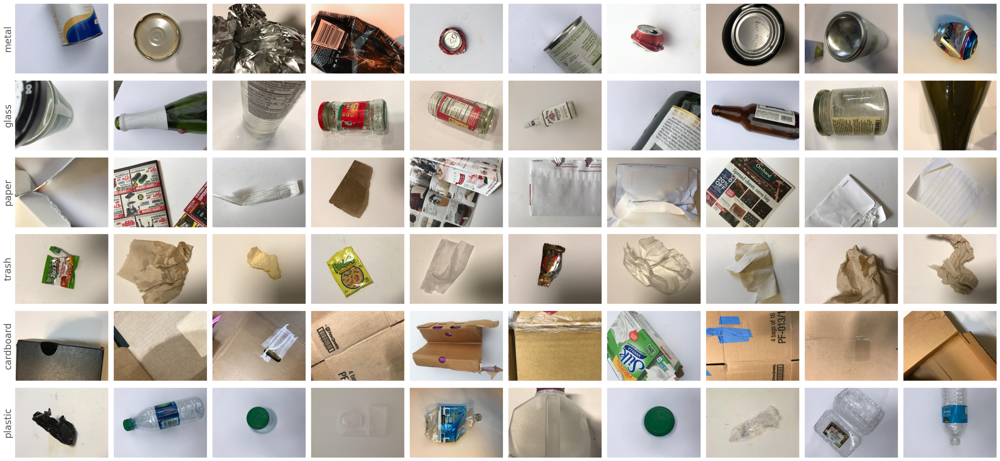

In [39]:
plt.figure(figsize=(30,14))

for i in range(6):
    directory = os.path.join(train_dir, labels[i])
    for j in range(10):
        path = os.path.join(directory, os.listdir(directory)[j])
        img = mpimg.imread(path)
        
        plt.subplot(6, 10, i*10 + j + 1)
        plt.imshow(img)
        
        if j == 0:
            plt.ylabel(labels[i], fontsize=20)
        
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);
plt.tight_layout()
plt.show()

In [40]:
directory = os.path.join(train_dir, 'cardboard')
path = os.path.join(directory, os.listdir(directory)[0])
image = mpimg.imread(path)
image.shape

(384, 512, 3)

In [41]:
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    dataset_dir,  
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    dataset_dir,  
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)

Found 2024 images belonging to 6 classes.
Found 503 images belonging to 6 classes.


In [42]:
custom_model = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(256, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(512, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(6, activation='softmax')
])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [43]:
custom_model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# summary
custom_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │    12,845,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,399,622 (54.93 MB)

 Trainable params: 14,399,622 (54.93 MB)

 Non-trainable params: 0 (0.00 B)

In [46]:
history_custom = custom_model.fit(train_generator,
                    validation_data=validation_generator,
                    epochs=30,
                    verbose=1)

Epoch 1/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 165ms/step - accuracy: 0.8410 - loss: 0.4603 - val_accuracy: 0.5765 - val_loss: 1.4057
Epoch 2/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - accuracy: 0.8478 - loss: 0.4484 - val_accuracy: 0.5547 - val_loss: 1.6309
Epoch 3/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.8192 - loss: 0.4628 - val_accuracy: 0.5805 - val_loss: 1.4279
Epoch 4/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.8486 - loss: 0.3952 - val_accuracy: 0.5626 - val_loss: 1.7213
Epoch 5/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - accuracy: 0.9039 - loss: 0.2757 - val_accuracy: 0.6024 - val_loss: 1.5738
Epoch 6/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - accuracy: 0.9152 - loss: 0.2809 - val_accuracy: 0.5845 - val_loss: 1.8202
Epoch 7/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 143ms/step - accuracy: 0.9266 - loss: 0.2342 - val_accuracy: 0.6223 - val_loss: 1.7223
Epoch 8/30
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.9223 - loss: 0.2335 - val_accuracy: 0.

In [47]:
test_loss, test_acc = custom_model.evaluate(validation_generator)
print(f"Test Accuracy: {test_acc}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.6396 - loss: 2.3271
Test Accuracy: 0.596421480178833


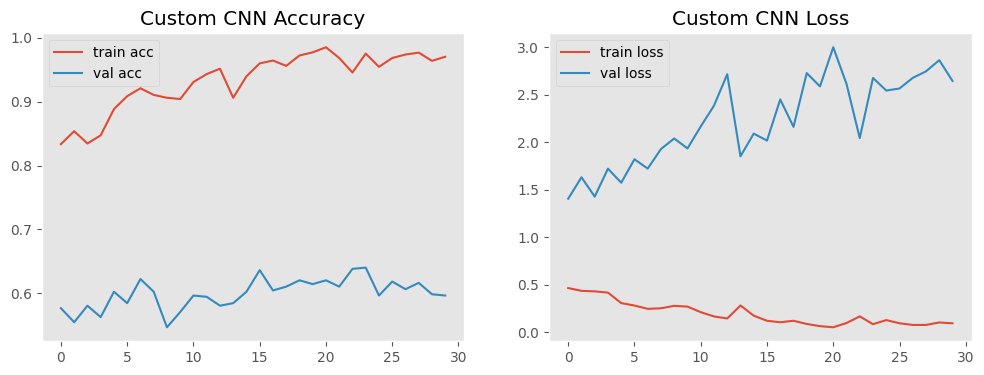

In [48]:
# quick plot
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(history_custom.history['accuracy'], label='train acc')
plt.plot(history_custom.history['val_accuracy'], label='val acc')
plt.legend(); plt.grid(); plt.title('Custom CNN Accuracy')

plt.subplot(1,2,2)
plt.plot(history_custom.history['loss'], label='train loss')
plt.plot(history_custom.history['val_loss'], label='val loss')
plt.legend(); plt.grid(); plt.title('Custom CNN Loss')
plt.show()

In [52]:
custom_model.save("custom_CNN.h5")

<div style="padding:10px; color:white; margin:5; font-size:170%; text-align:left; display:fill; border-radius:15px; background-color:#294B8E; overflow:hidden; font-weight:700">9. Compare results & plots</div>

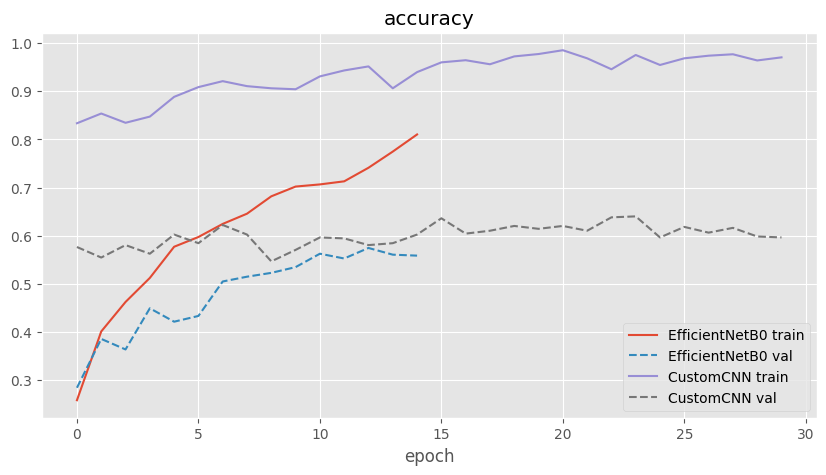

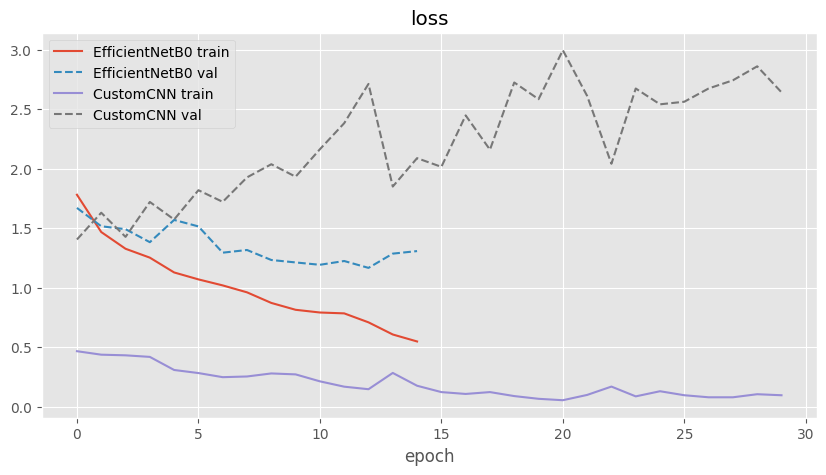

In [51]:
# --- Compare results & plots ---
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# Collect training histories (ensure these names exist in the kernel)
histories = {}
if 'history' in globals():
    histories['EfficientNetB0'] = history
if 'history_custom' in globals():
    histories['CustomCNN'] = history_custom

def plot_histories(histories, metric='accuracy'):
    plt.figure(figsize=(10,5))
    for name, h in histories.items():
        if metric in h.history:
            plt.plot(h.history[metric], label=f'{name} train')
        if 'val_'+metric in h.history:
            plt.plot(h.history['val_'+metric], '--', label=f'{name} val')
    plt.title(metric)
    plt.xlabel('epoch')
    plt.legend()
    plt.grid(True)
    plt.show()

if histories:
    plot_histories(histories, 'accuracy')
    plot_histories(histories, 'loss')
else:
    print("No training histories found. Run training cells and store histories as: history_mobilenet, history_eff, history_custom")